In [1]:
from lsmc_orbit import lsmc_orbit2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm as LN
from astropy import units as u
from astropy.coordinates import SkyCoord
import MagellanicStream as ms
from plotms import plotms
from plotnbody import plotnbody
from outputread import outputread
from galsat import galsat

In [3]:
output2 = lsmc_orbit2()

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  1.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  1.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 1000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  31.04003107667027  195.0733856759005  -51.82142794891986    kpc
VxVyVz =  -11.025779426484078  -175.49653989963932  -46.105414884424306    km/s
Soft   =  5.081594555957554    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 1000 STARS
Getting Plummer distribution of stars

PARAM INPUTS
-----------------------------------------------------
XYZ    =  17.57579035779458  197.270935133182  -80.34582157679885    kpc
VxVyVz =  -25.8397

In [4]:
output2

TIME,INDEX,MASS,SOFT,X,Y,Z,VX,VY,VZ
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
-1.0,0.0,180000000000.0,5.081594555957554,31.04003107667027,195.0733856759005,-51.82142794891986,-11.025779426484078,-175.49653989963932,-46.105414884424306
-1.0,1.0,0.0,0.0,14.04408452494406,196.9935153125503,-46.20865725064528,-9.355969525032604,-197.9992785584989,59.32679419729548
-1.0,2.0,0.0,0.0,34.89958748478109,194.6197014814223,-49.36432294837756,-69.7203863326427,-156.68052085233,-171.27798395058724
-1.0,3.0,0.0,0.0,33.9873844608797,194.1861087680469,-48.96368964845524,13.680170322922397,-139.93119916800148,-216.53759131703418
-1.0,4.0,0.0,0.0,38.96016502750041,192.7436541951772,-46.02037708696601,-120.56181697937724,-133.4154219491421,-182.43163276902044
-1.0,5.0,0.0,0.0,39.16119082904861,194.5613181857304,-57.15537417916823,-51.57523982513025,-139.62759792310354,-211.5625889674411
-1.0,6.0,0.0,0.0,23.71934909767579,196.7244174193476,-42.77153195116615,122.36476029177774,-190.85013298626566,42.594665052649866
-1.0,7.0,0.0,0.0,28.52022166441651,194.990397812313,-56.2319240292103,-257.7691946485788,-176.8647034523679,128.51868964239478
-1.0,8.0,0.0,0.0,31.40564405324655,196.0733828742478,-54.34164771313872,-144.18608536598967,-60.09482112883004,-273.54850242078663


In [5]:
last = output2[(output2['TIME']==np.max(output2['TIME']))]
last

TIME,INDEX,MASS,SOFT,X,Y,Z,VX,VY,VZ
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1.1102230246251565e-15,0.0,180000000000.0,5.081594555957554,-0.7189803142567635,-41.27600928455329,-27.31533497844739,-57.22788235428916,-227.11309218364323,220.6417056525346
1.1102230246251565e-15,1.0,0.0,0.0,-13.70703541232168,-37.0438905747945,-28.42572749885808,-193.99376366912728,-209.92594063289192,419.9122916396509
1.1102230246251565e-15,2.0,0.0,0.0,0.2325530857934401,-41.74219408513403,-26.2422742320192,-229.69645716788003,-224.6440448492652,-68.69335791415553
1.1102230246251565e-15,3.0,0.0,0.0,-3.021355223864569,-41.78558203424455,-25.81479183600331,-91.2337528818529,-227.13973720072408,469.0625635656969
1.1102230246251565e-15,4.0,0.0,0.0,2.554422844259318,-41.79162063304383,-14.48125306764683,-0.2005824306882593,-254.46190341270548,358.9387384431869
1.1102230246251565e-15,5.0,0.0,0.0,-7.425409570640244,-40.23304123457675,-27.77322939609139,-204.90936717517542,-291.69460769825287,434.1451531225677
1.1102230246251565e-15,6.0,0.0,0.0,0.8782535662723284,-40.86754522835226,-14.51545832568839,94.246743521181,-262.8651130032156,358.9748025237077
1.1102230246251565e-15,7.0,0.0,0.0,7.601944230341539,-41.11748656936931,-28.82983943457316,-45.63387207109056,-248.61580150638358,56.69601704805303
1.1102230246251565e-15,8.0,0.0,0.0,-0.8565339156238265,-42.56593521200415,-25.59170952991534,182.57910260029897,-394.26711882178904,390.44152975307804


In [6]:
stars = last[(last['MASS']==0)]
mc = last[(last['MASS']>0)]

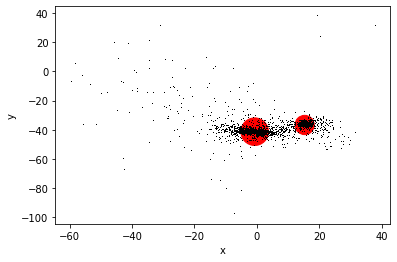

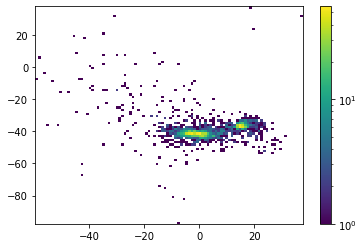

In [7]:
plt.plot(stars['X'],stars['Y'],'k,')
plt.scatter(mc['X'],mc['Y'],c='r',s=mc['SOFT']*150)
plt.xlabel('x')
plt.ylabel('y')
plt.figure()
plt.hist2d(stars['X'],stars['Y'],bins=100,norm=LN())
plt.colorbar()
plt.show()

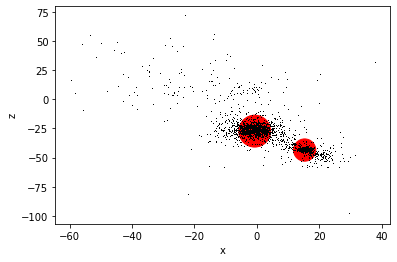

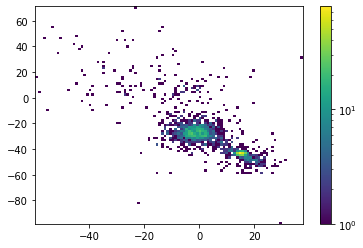

In [8]:
plt.plot(stars['X'],stars['Z'],'k,')
plt.scatter(mc['X'],mc['Z'],c='r',s=mc['SOFT']*200)
plt.xlabel('x')
plt.ylabel('z')
plt.figure()
plt.hist2d(stars['X'],stars['Z'],bins=100,norm=LN())
plt.colorbar()
plt.show()

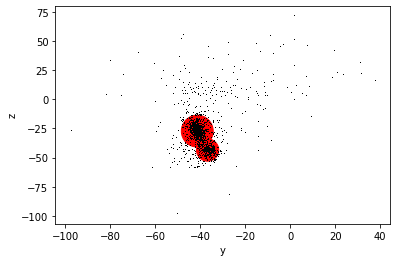

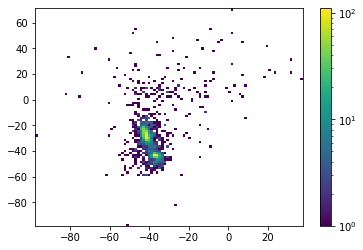

In [9]:
plt.plot(stars['Y'],stars['Z'],'k,')
plt.scatter(mc['Y'],mc['Z'],c='r',s=mc['SOFT']*200)
plt.xlabel('y')
plt.ylabel('z')
plt.figure()
plt.hist2d(stars['Y'],stars['Z'],bins=100,norm=LN())
plt.colorbar()
plt.show()

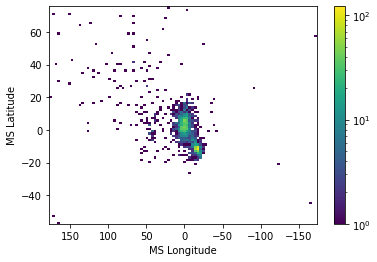

In [12]:
plotms(output2)

In [13]:
theta = 78.42
phi = 83.48
itheta = theta*np.pi/180
iphi = phi*np.pi/180
center = last[(last['INDEX']==0)]
stars = last[(last['INDEX']!=0)&(last['INDEX']<1001)]
x00 = center['X'][0]
y00 = center['Y'][0]
z00 = center['Z'][0]
vx00 = center['VX'][0]
vy00 = center['VY'][0]
vz00 = center['VZ'][0]
Lx = sum((stars['Y']-y00)*(stars['VZ']-vz00)-\
         (stars['Z']-z00)*(stars['VY']-vy00))
Ly = sum((stars['Z']-z00)*(stars['VX']-vx00)-\
         (stars['X']-x00)*(stars['VZ']-vz00))
Lz = sum((stars['X']-x00)*(stars['VY']-vy00)-\
         (stars['Y']-y00)*(stars['VX']-vx00))
L2 = Lx**2+Ly**2+Lz**2
thetaij = np.arccos(Lz/np.sqrt(L2))
phiij = np.arccos(Lx/np.sqrt(Lx**2+Ly**2))
if Ly<0:
    phiij = 2*np.pi-phiij
ftheta = thetaij*180/np.pi
fphi = phiij*180/np.pi
nx1 = np.sin(itheta)*np.cos(iphi)
ny1 = np.sin(itheta)*np.sin(iphi)
nz1 = np.cos(itheta)
nx2 = np.sin(thetaij)*np.cos(phiij)
ny2 = np.sin(thetaij)*np.sin(phiij)
nz2 = np.cos(thetaij)
dot = nx1*nx2+ny1*ny2+nz1*nz2
angleij = np.arccos(dot)
angle = angleij*180/np.pi
print('Change in L angle = {} degrees'.format(angle))

Change in L angle = 1.9066957519472552 degrees


In [5]:
output3 = lsmc_orbit2(tstart=4.0)

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 1000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  12.57149044770737  270.8149244469767  133.5474403104158    kpc
VxVyVz =  22.78930511435964  106.30906634344281  -33.198899984454336    km/s
Soft   =  5.081594555957554    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 1000 STARS
Getting Plummer distribution of stars

PARAM INPUTS
-----------------------------------------------------
XYZ    =  6.190561317997147  294.4761168568185  161.5996454008236    kpc
VxVyVz =  -23.03053173

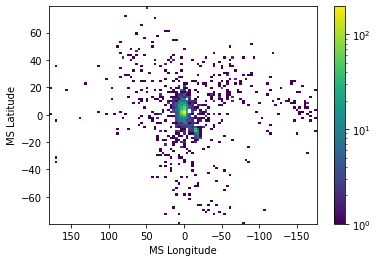

In [8]:
plotms(output3)

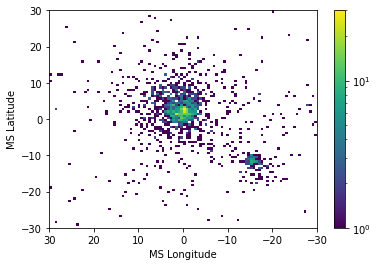

In [9]:
last = output3[(output3['TIME']==np.max(output3['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  12.67550646806105  271.1362211969763  133.794360293482    kpc
VxVyVz =  23.66099351176502  104.87356388084147  -34.569281401127526    km/s
Soft   =  5.0    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  30002
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   = 

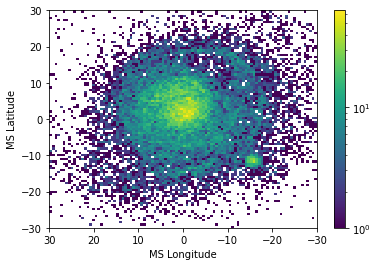

In [3]:
output1 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                      h=1)#ostep=0.05)
last = output1[(output1['TIME']==np.max(output1['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

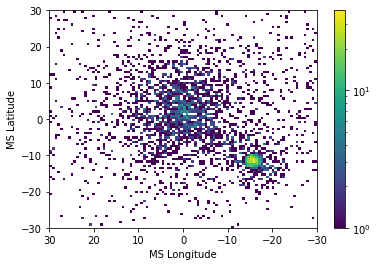

In [4]:
smc = output1[(output1['INDEX']>=25001)]
last = smc[(smc['TIME']==np.max(smc['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  96.5416213090416  654.4941239512319  -32.72407809085352    kpc
VxVyVz =  -0.5671033263788219  -69.78730205342694  -39.88943593178466    km/s
Soft   =  5.0    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  30002
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   

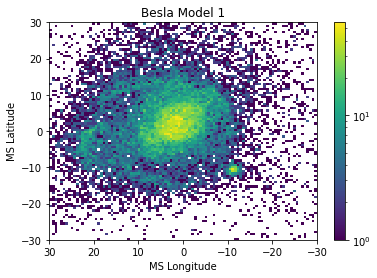

In [3]:
output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                      h=1,model='Besla1')#ostep=0.05)
last = output2[(output2['TIME']==np.max(output2['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.title('Besla Model 1')
plt.show()

In [4]:
theta = 78.42
phi = 83.48
itheta = theta*np.pi/180
iphi = phi*np.pi/180
times = np.unique(output2['TIME'])
thetas = np.zeros(len(times))
phis = np.zeros(len(times))
angles = np.zeros(len(times))
dists = np.zeros(len(times))
for i in range(len(times)):
    last = output2[(output2['TIME']==times[i])]
    center = last[(last['INDEX']==0)]
    scenter = last[(last['INDEX']==25001)]
    stars = last[(last['INDEX']!=0)&(last['INDEX']<25001)]
    x00 = center['X'][0]
    y00 = center['Y'][0]
    z00 = center['Z'][0]
    x01 = scenter['X'][0]
    y01 = scenter['Y'][0]
    z01 = scenter['Z'][0]
    vx00 = center['VX'][0]
    vy00 = center['VY'][0]
    vz00 = center['VZ'][0]
    Lx = sum((stars['Y']-y00)*(stars['VZ']-vz00)-\
             (stars['Z']-z00)*(stars['VY']-vy00))
    Ly = sum((stars['Z']-z00)*(stars['VX']-vx00)-\
             (stars['X']-x00)*(stars['VZ']-vz00))
    Lz = sum((stars['X']-x00)*(stars['VY']-vy00)-\
             (stars['Y']-y00)*(stars['VX']-vx00))
    L2 = Lx**2+Ly**2+Lz**2
    thetaij = np.arccos(Lz/np.sqrt(L2))
    phiij = np.arccos(Lx/np.sqrt(Lx**2+Ly**2))
    if Ly<0:
        phiij = 2*np.pi-phiij
    ftheta = thetaij*180/np.pi
    thetas[i] = ftheta
    fphi = phiij*180/np.pi
    phis[i] = fphi
    nx1 = np.sin(itheta)*np.cos(iphi)
    ny1 = np.sin(itheta)*np.sin(iphi)
    nz1 = np.cos(itheta)
    nx2 = np.sin(thetaij)*np.cos(phiij)
    ny2 = np.sin(thetaij)*np.sin(phiij)
    nz2 = np.cos(thetaij)
    dot = nx1*nx2+ny1*ny2+nz1*nz2
    angleij = np.arccos(dot)
    angle = angleij*180/np.pi
    angles[i] = angle
    disti = np.sqrt((x00-x01)**2+(y00-y01)**2+(z00-z01)**2)
    dists[i] = disti
print('Change in L angle = {} degrees'.format(angle))

Change in L angle = 5.939472461751764 degrees


Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  91.85755782385219  581.5319595059319  12.91264754864391    kpc
VxVyVz =  -0.3347753622259112  -27.58334237019369  -48.44208404532916    km/s
Soft   =  5.0    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  30002
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   

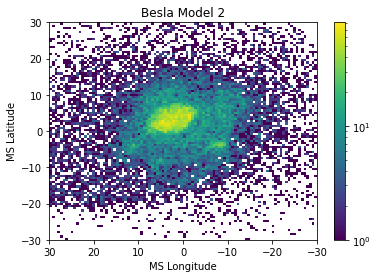

In [5]:
output3 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                      h=1,model='Besla2')#ostep=0.05)
last = output3[(output3['TIME']==np.max(output3['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.title('Besla Model 2')
plt.show()

In [6]:
theta = 78.42
phi = 83.48
itheta = theta*np.pi/180
iphi = phi*np.pi/180
times = np.unique(output3['TIME'])
thetas = np.zeros(len(times))
phis = np.zeros(len(times))
angles = np.zeros(len(times))
dists = np.zeros(len(times))
for i in range(len(times)):
    last = output3[(output3['TIME']==times[i])]
    center = last[(last['INDEX']==0)]
    scenter = last[(last['INDEX']==25001)]
    stars = last[(last['INDEX']!=0)&(last['INDEX']<25001)]
    x00 = center['X'][0]
    y00 = center['Y'][0]
    z00 = center['Z'][0]
    x01 = scenter['X'][0]
    y01 = scenter['Y'][0]
    z01 = scenter['Z'][0]
    vx00 = center['VX'][0]
    vy00 = center['VY'][0]
    vz00 = center['VZ'][0]
    Lx = sum((stars['Y']-y00)*(stars['VZ']-vz00)-\
             (stars['Z']-z00)*(stars['VY']-vy00))
    Ly = sum((stars['Z']-z00)*(stars['VX']-vx00)-\
             (stars['X']-x00)*(stars['VZ']-vz00))
    Lz = sum((stars['X']-x00)*(stars['VY']-vy00)-\
             (stars['Y']-y00)*(stars['VX']-vx00))
    L2 = Lx**2+Ly**2+Lz**2
    thetaij = np.arccos(Lz/np.sqrt(L2))
    phiij = np.arccos(Lx/np.sqrt(Lx**2+Ly**2))
    if Ly<0:
        phiij = 2*np.pi-phiij
    ftheta = thetaij*180/np.pi
    thetas[i] = ftheta
    fphi = phiij*180/np.pi
    phis[i] = fphi
    nx1 = np.sin(itheta)*np.cos(iphi)
    ny1 = np.sin(itheta)*np.sin(iphi)
    nz1 = np.cos(itheta)
    nx2 = np.sin(thetaij)*np.cos(phiij)
    ny2 = np.sin(thetaij)*np.sin(phiij)
    nz2 = np.cos(thetaij)
    dot = nx1*nx2+ny1*ny2+nz1*nz2
    angleij = np.arccos(dot)
    angle = angleij*180/np.pi
    angles[i] = angle
    disti = np.sqrt((x00-x01)**2+(y00-y01)**2+(z00-z01)**2)
    dists[i] = disti
print('Change in L angle = {} degrees'.format(angle))

Change in L angle = 14.455661636371795 degrees


Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
272.57118034362793 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
265.01542568206787 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
209.56293988227844 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
206.35660314559937 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Maki

<ipython-input-4-b6dc02ad9ade>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
203.99262237548828 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.46352434158325 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
205.7003138065338 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.8337516784668 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plumm

204.17100596427917 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.6714563369751 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.56416630744934 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.40160083770752 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.83955097198486 seconds
Running the two single particles backwards
 
Runni

Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.9202971458435 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.77982568740845 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
204.56731915473938 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.94025015830994 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Runni

Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.58549427986145 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
205.79497575759888 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.14787912368774 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.17486119270325 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plu

201.65960431098938 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
222.5764558315277 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
217.5680763721466 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
206.08616018295288 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.62452006340027 seconds
Running the two single particles backwards
 
Runnin

Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.73362278938293 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.2894308567047 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.41688632965088 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
206.52932238578796 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Runni

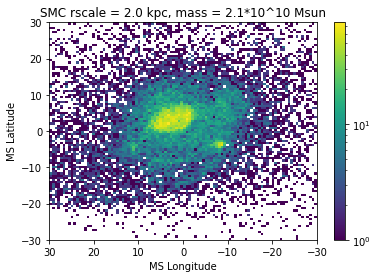

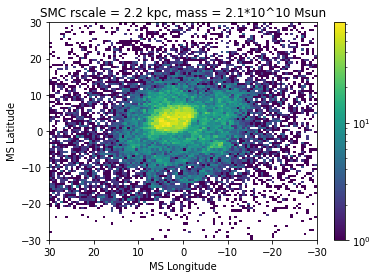

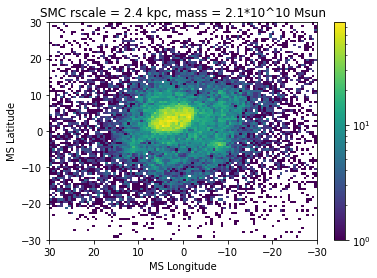

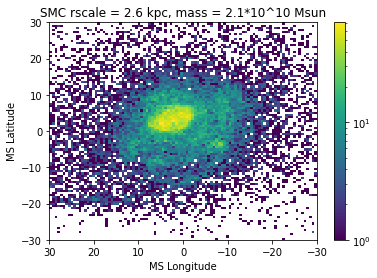

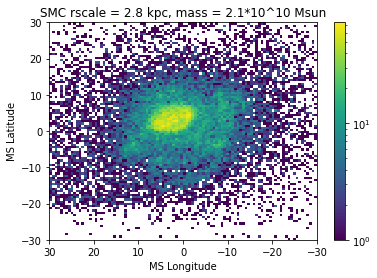

...

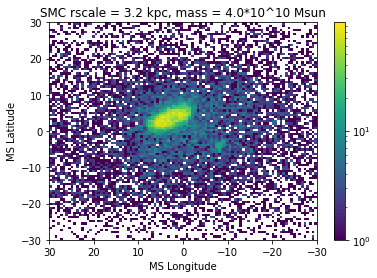

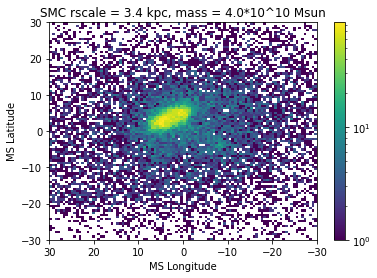

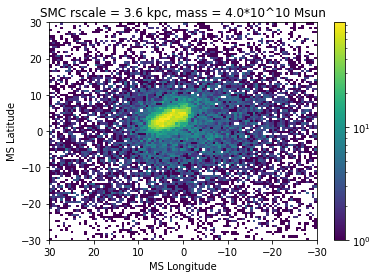

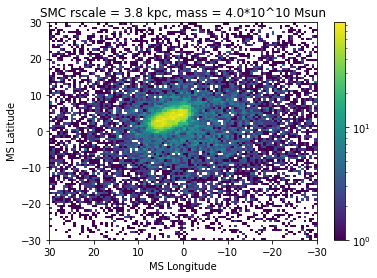

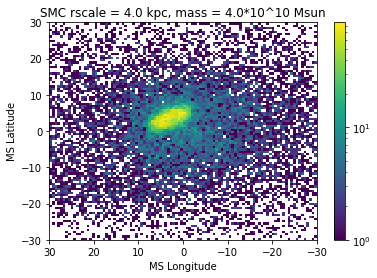

In [4]:
for smass in np.linspace(2.1,4,20):
    for rsmc in np.linspace(2,4,11):
        output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                              h=1,rsmc=rsmc,noprint=True,
                              smass=smass*10**10,model='Besla2')
        last = output2[(output2['TIME']==np.max(output2['TIME']))]
        c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                        unit=u.kpc,frame='galactocentric')
        c_ms = c_gc.transform_to(ms.MagellanicStream)
        ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
        a = np.where(ms_lg>180)
        ms_lg[a] = ms_lg[a]-360
        plt.figure()
        plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
                   range=[[-30,30],[-30,30]])
        plt.colorbar()
        plt.xlim(30,-30)
        plt.xlabel('MS Longitude')
        plt.ylabel('MS Latitude')
        plt.title('SMC rscale = {} kpc, mass = {}*10^10 Msun'.format(round(rsmc,1),round(smass,1)))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.31183052062988 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
199.53546667099 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
196.111172914505 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
223.59315729141235 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making th

<ipython-input-2-c138f1a26bae>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
197.91699624061584 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
197.26786065101624 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
196.62140274047852 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.30760645866394 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plu

221.47346663475037 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
211.913715839386 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
223.21232843399048 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
231.1852788925171 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
236.5341022014618 seconds
Running the two single particles backwards
 
Running 

Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
198.19715452194214 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.1112940311432 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
198.0898880958557 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
197.49522280693054 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Runnin

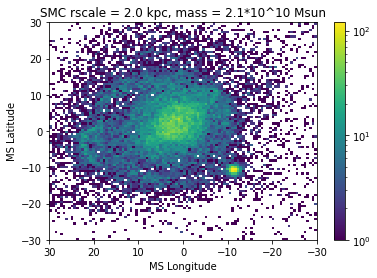

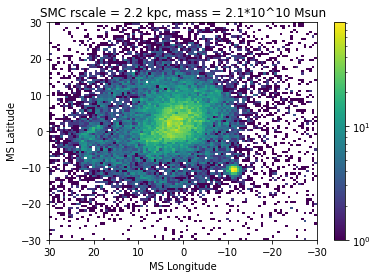

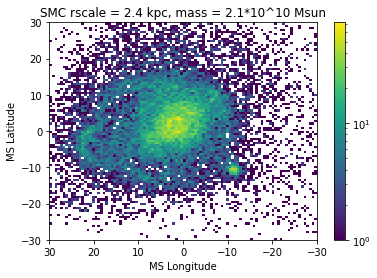

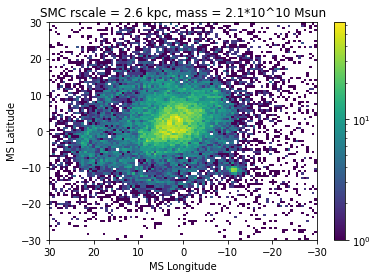

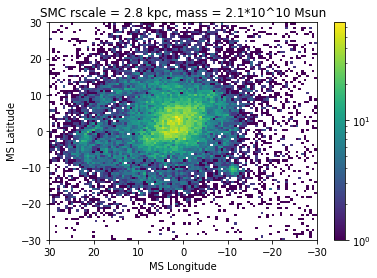

...

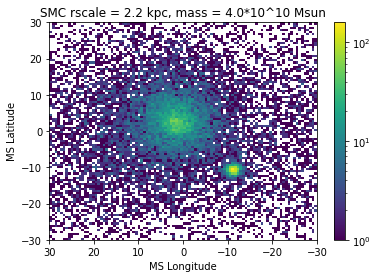

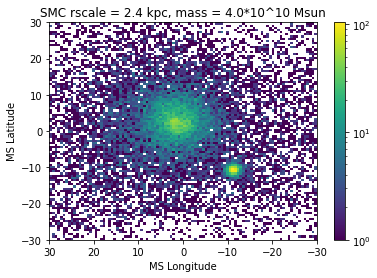

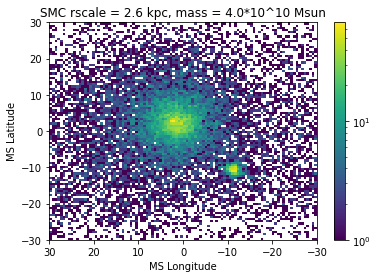

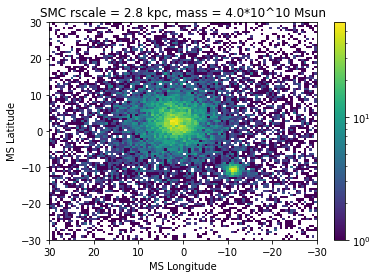

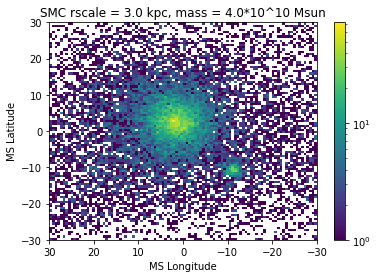

In [2]:
for smass in np.linspace(2.1,4,20):
    for rsmc in np.linspace(2,3,6):
        output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                              h=1,rsmc=rsmc,noprint=True,
                              smass=smass*10**10,model='Besla1')
        last = output2[(output2['TIME']==np.max(output2['TIME']))]
        c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                        unit=u.kpc,frame='galactocentric')
        c_ms = c_gc.transform_to(ms.MagellanicStream)
        ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
        a = np.where(ms_lg>180)
        ms_lg[a] = ms_lg[a]-360
        plt.figure()
        plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
                   range=[[-30,30],[-30,30]])
        plt.colorbar()
        plt.xlim(30,-30)
        plt.xlabel('MS Longitude')
        plt.ylabel('MS Latitude')
        plt.title('SMC rscale = {} kpc, mass = {}*10^10 Msun'.format(round(rsmc,1),round(smass,1)))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.88512110710144 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.03741192817688 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.02424263954163 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
203.932945966720

<ipython-input-7-434c8ee4f179>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.76401710510254 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.6767647266388 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
201.36102986335754 seconds
 
Running GALSAT program ...


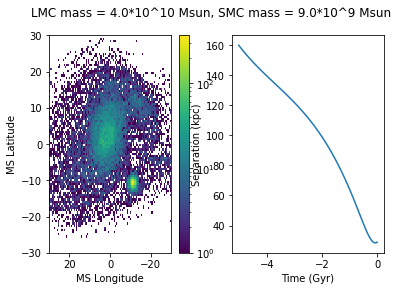

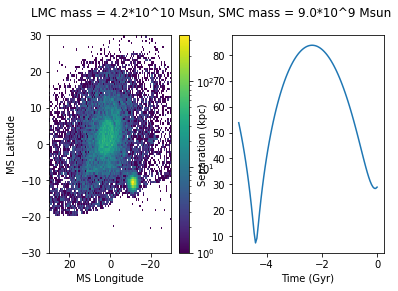

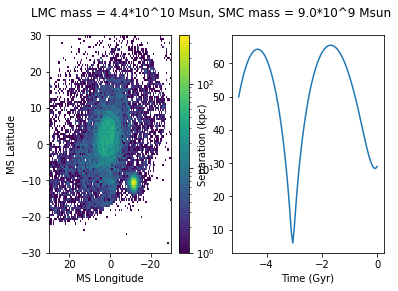

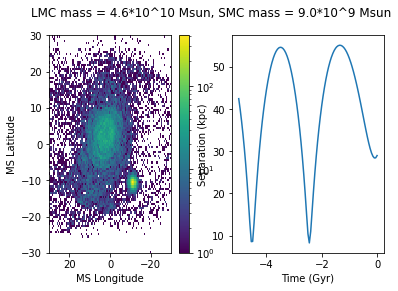

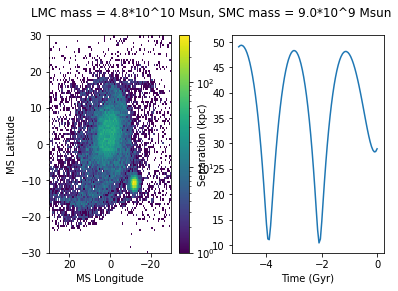

...

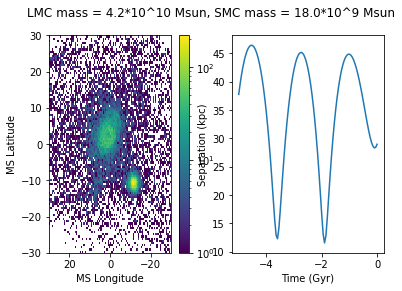

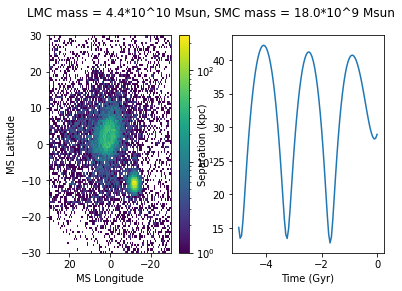

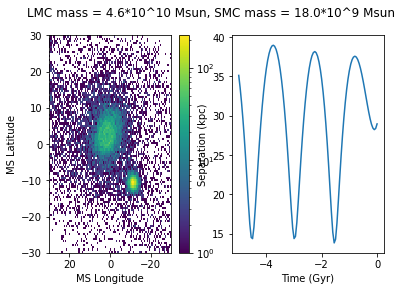

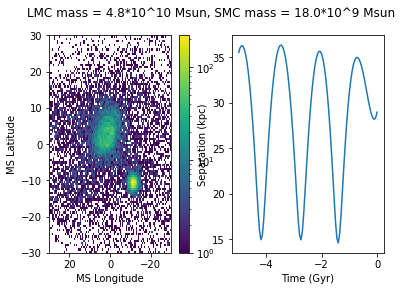

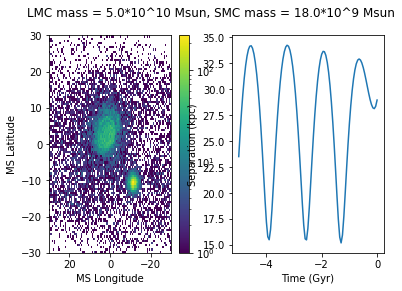

In [7]:
for smass in np.linspace(9,18,4):
    for lmass in np.linspace(4,5,6):
        output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                              h=1,lmass=lmass*10**10,noprint=True,
                              smass=smass*10**9,model='Besla1')
        last = output2[(output2['TIME']==np.max(output2['TIME']))]
        c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                        unit=u.kpc,frame='galactocentric')
        c_ms = c_gc.transform_to(ms.MagellanicStream)
        ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
        a = np.where(ms_lg>180)
        ms_lg[a] = ms_lg[a]-360
        plt.figure()
        plt.subplot(1,2,1)
        plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
                   range=[[-30,30],[-30,30]])
        plt.colorbar()
        plt.xlim(30,-30)
        plt.xlabel('MS Longitude')
        plt.ylabel('MS Latitude')
        
        plt.subplot(1,2,2)
        vxlmc = -72
        vylmc = -267
        vzlmc = 250
        xlmc = -1
        ylmc = -40
        zlmc = -25
        lsoft = 13
        inplmc = [lmass*10**10,lsoft,xlmc,ylmc,zlmc,vxlmc,vylmc,vzlmc]
        vxsmc = -88
        vysmc = -384
        vzsmc = 246
        xsmc = 18
        ysmc = -46
        zsmc = -46
        ssoft = 3.8
        inpsmc = [smass*10**9,ssoft,xsmc,ysmc,zsmc,vxsmc,vysmc,vzsmc]
        input1 = np.vstack((inplmc,inpsmc))
        galsat(input1,step=0.01,ostep=0.05,dstep=5.0,tmin=5.0,
               prog='galsat6',outfile='besla1',noprint=True)
        out = outputread('besla1.out')
        lmc = out[(out['INDEX']==0)]
        smc = out[(out['INDEX']==1)]
        sep = np.sqrt((lmc['X']-smc['X'])**2+(lmc['Y']-smc['Y'])**2+(lmc['Z']-smc['Z'])**2)
        plt.plot(lmc['TIME'],sep)
        plt.xlabel('Time (Gyr)')
        plt.ylabel('Separation (kpc)')
        plt.suptitle('LMC mass = {}*10^10 Msun, SMC mass = {}*10^9 Msun'.format(round(lmass,1),round(smass,1)))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.6365876197815 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
217.63343572616577 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.67507195472717 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
204.4084920883178

<ipython-input-8-e01584209704>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
218.8895080089569 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
217.36422538757324 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
223.329274892807 seconds
 
Running GALSAT program ...


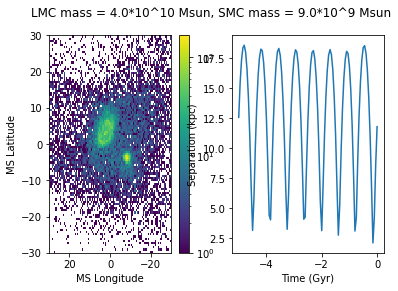

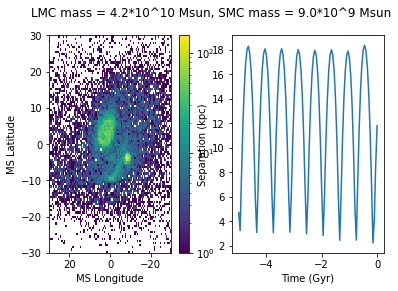

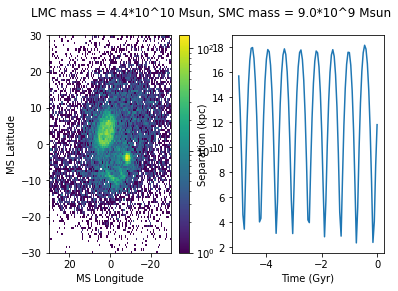

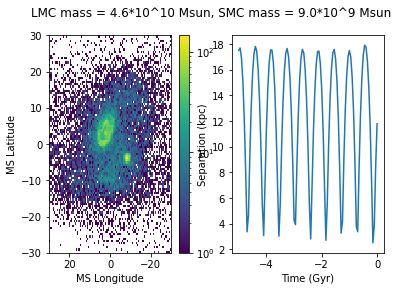

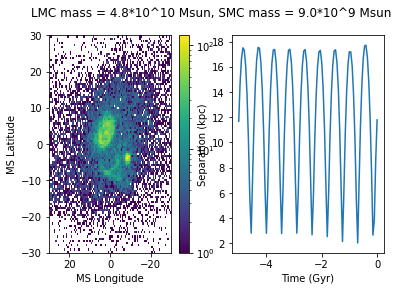

...

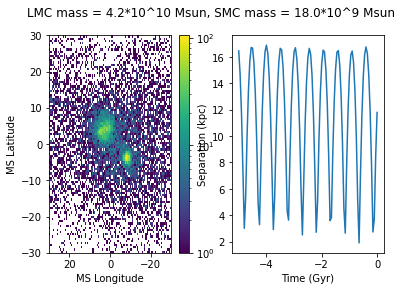

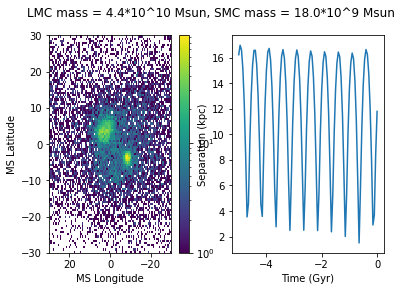

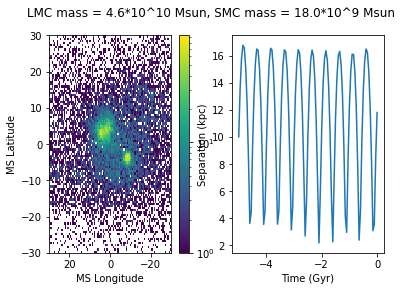

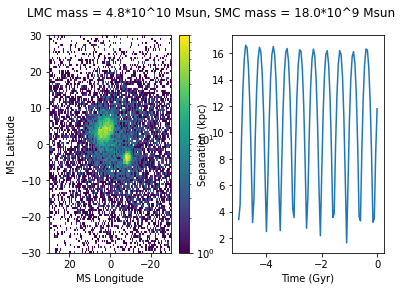

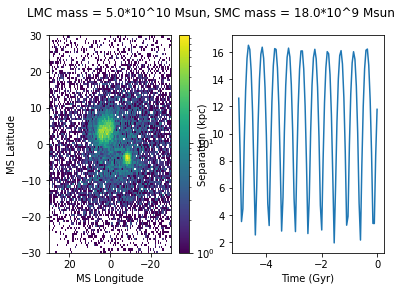

In [8]:
for smass in np.linspace(9,18,4):
    for lmass in np.linspace(4,5,6):
        output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                              h=1,lmass=lmass*10**10,noprint=True,
                              smass=smass*10**9,model='Besla2')
        last = output2[(output2['TIME']==np.max(output2['TIME']))]
        c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                        unit=u.kpc,frame='galactocentric')
        c_ms = c_gc.transform_to(ms.MagellanicStream)
        ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
        a = np.where(ms_lg>180)
        ms_lg[a] = ms_lg[a]-360
        plt.figure()
        plt.subplot(1,2,1)
        plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
                   range=[[-30,30],[-30,30]])
        plt.colorbar()
        plt.xlim(30,-30)
        plt.xlabel('MS Longitude')
        plt.ylabel('MS Latitude')
        
        plt.subplot(1,2,2)
        vxlmc = -82
        vylmc = -263
        vzlmc = 249
        xlmc = -1
        ylmc = -42
        zlmc = -26
        lsoft = 13
        inplmc = [lmass*10**10,lsoft,xlmc,ylmc,zlmc,vxlmc,vylmc,vzlmc]
        vxsmc = -66
        vysmc = -258
        vzsmc = 198
        xsmc = 6
        ysmc = -39
        zsmc = -35
        ssoft = 3.8
        inpsmc = [smass*10**9,ssoft,xsmc,ysmc,zsmc,vxsmc,vysmc,vzsmc]
        input1 = np.vstack((inplmc,inpsmc))
        galsat(input1,step=0.01,ostep=0.05,dstep=5.0,tmin=5.0,
               prog='galsat6',outfile='besla2',noprint=True)
        out = outputread('besla2.out')
        lmc = out[(out['INDEX']==0)]
        smc = out[(out['INDEX']==1)]
        sep = np.sqrt((lmc['X']-smc['X'])**2+(lmc['Y']-smc['Y'])**2+(lmc['Z']-smc['Z'])**2)
        plt.plot(lmc['TIME'],sep)
        plt.xlabel('Time (Gyr)')
        plt.ylabel('Separation (kpc)')
        plt.suptitle('LMC mass = {}*10^10 Msun, SMC mass = {}*10^9 Msun'.format(round(lmass,1),round(smass,1)))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
224.78067755699158 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
217.5920536518097 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.00666880607605 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
203.0731422901153

<ipython-input-2-3614bc5c8f80>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
203.69730973243713 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
200.73288750648499 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
206.6317377090454 seconds
 
Running GALSAT program ...
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
202.8749804496765

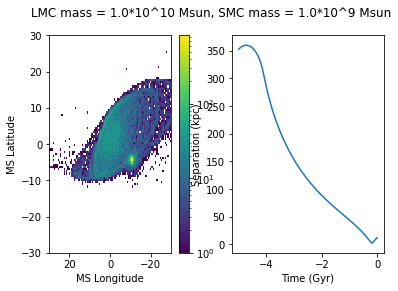

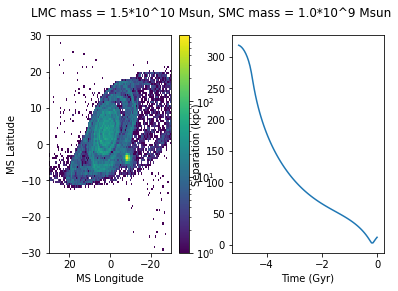

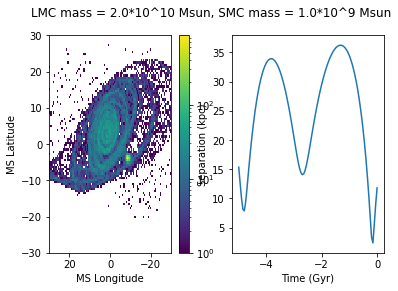

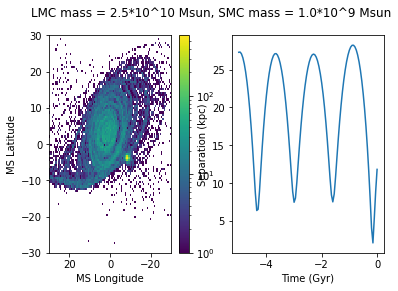

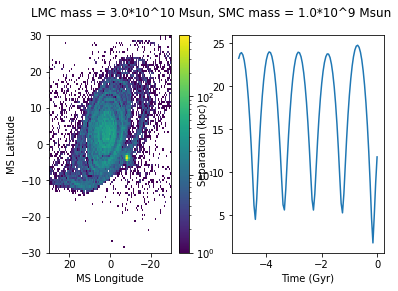

...

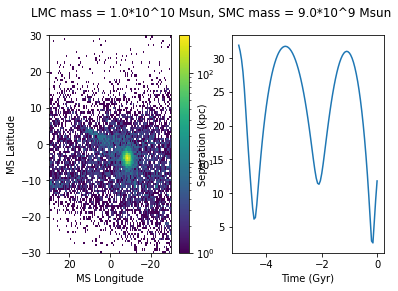

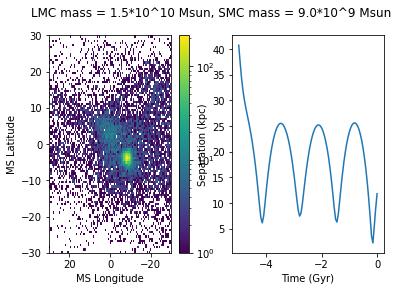

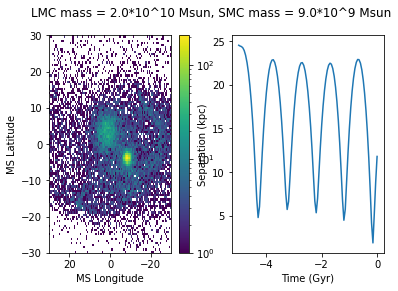

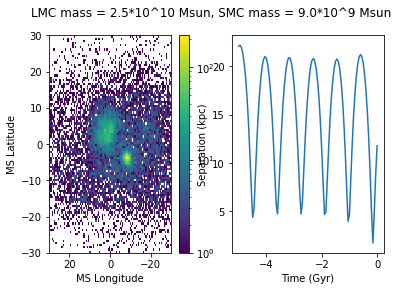

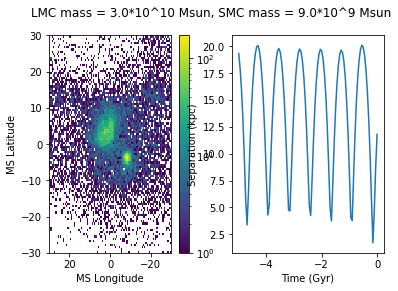

In [2]:
for smass in np.linspace(1,9,5):
    for lmass in np.linspace(1,3,5):
        output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                              h=1,lmass=lmass*10**10,noprint=True,
                              smass=smass*10**9,model='Besla2')
        last = output2[(output2['TIME']==np.max(output2['TIME']))]
        c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                        unit=u.kpc,frame='galactocentric')
        c_ms = c_gc.transform_to(ms.MagellanicStream)
        ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
        a = np.where(ms_lg>180)
        ms_lg[a] = ms_lg[a]-360
        plt.figure()
        plt.subplot(1,2,1)
        plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
                   range=[[-30,30],[-30,30]])
        plt.colorbar()
        plt.xlim(30,-30)
        plt.xlabel('MS Longitude')
        plt.ylabel('MS Latitude')
        
        plt.subplot(1,2,2)
        vxlmc = -82
        vylmc = -263
        vzlmc = 249
        xlmc = -1
        ylmc = -42
        zlmc = -26
        lsoft = 13
        inplmc = [lmass*10**10,lsoft,xlmc,ylmc,zlmc,vxlmc,vylmc,vzlmc]
        vxsmc = -66
        vysmc = -258
        vzsmc = 198
        xsmc = 6
        ysmc = -39
        zsmc = -35
        ssoft = 3.8
        inpsmc = [smass*10**9,ssoft,xsmc,ysmc,zsmc,vxsmc,vysmc,vzsmc]
        input1 = np.vstack((inplmc,inpsmc))
        galsat(input1,step=0.01,ostep=0.05,dstep=5.0,tmin=5.0,
               prog='galsat6',outfile='besla2',noprint=True)
        out = outputread('besla2.out')
        lmc = out[(out['INDEX']==0)]
        smc = out[(out['INDEX']==1)]
        sep = np.sqrt((lmc['X']-smc['X'])**2+(lmc['Y']-smc['Y'])**2+(lmc['Z']-smc['Z'])**2)
        plt.plot(lmc['TIME'],sep)
        plt.xlabel('Time (Gyr)')
        plt.ylabel('Separation (kpc)')
        plt.suptitle('LMC mass = {}*10^10 Msun, SMC mass = {}*10^9 Msun'.format(round(lmass,1),round(smass,1)))

In [2]:
output2 = lsmc_orbit2(tstart=4.0,Rd=13,nlmc=25000,nsmc=5000,
                      h=13/5,rsmc=3.8)#ostep=0.05)

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  12.57149044770737  270.8149244469767  133.5474403104158    kpc
VxVyVz =  22.78930511435964  106.30906634344281  -33.198899984454336    km/s
Soft   =  5.081594555957554    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars

PARAM INPUTS
-----------------------------------------------------
XYZ    =  6.190561317997147  294.4761168568185  161.5996454008236    kpc
VxVyVz =  -23.0305317

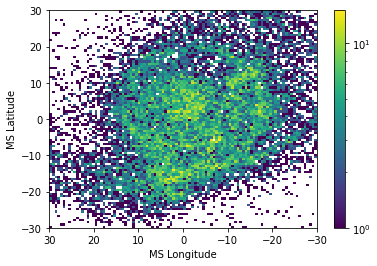

In [3]:
last = output2[(output2['TIME']==np.max(output2['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

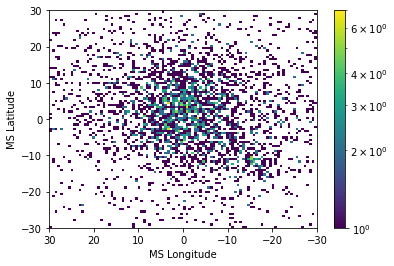

In [4]:
smc = output2[(output2['INDEX']>=25001)]
last = smc[(smc['TIME']==np.max(smc['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

In [6]:
lsmc_orbit2(tstart=4.0,Rd=13,nlmc=50000,nsmc=10000,h=13/5)#ostep=0.05)

Running the two single particles backwards
PARAM INPUTS
-----------------------------------------------------
Prog =  galsat6
Nbodies =  2
Tmin   =  4.0    Gyrs
Vcirc  =  220.0    km/s
Dhalo  =  13.0    kpc
Step   =  0.01
Ostep  =  0.01  Gyrs
Dstep  =  4.0  Gyrs
Using Milky Way Potential
Using Dynamical Friction
-----------------------------------------------------
 
Running GALSAT program ...
Making the LMC
USING 50000 STARS

PARAM INPUTS
-----------------------------------------------------
XYZ    =  12.57149044770737  270.8149244469767  133.5474403104158    kpc
VxVyVz =  22.78930511435964  106.30906634344281  -33.198899984454336    km/s
Soft   =  5.081594555957554    kpc
Mass   =  180000000000.0  Msun
-----------------------------------------------------
Making the SMC
USING 10000 STARS
Getting Plummer distribution of stars

PARAM INPUTS
-----------------------------------------------------
XYZ    =  6.190561317997147  294.4761168568185  161.5996454008236    kpc
VxVyVz =  -23.030531

IndexError: list index out of range

In [8]:
output5 = outputread('run2.out')
output5['TIME'] = output5['TIME']-output5['TIME'][-1]

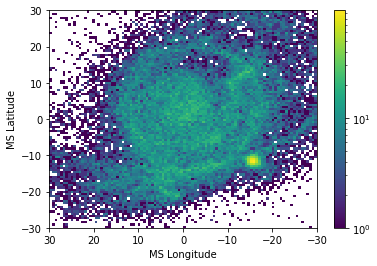

In [9]:
last = output5[(output5['TIME']==np.max(output5['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

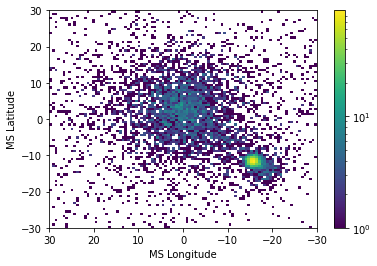

In [10]:
smc = output5[(output5['INDEX']>=50001)]
last = smc[(smc['TIME']==np.max(smc['TIME']))]
c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],unit=u.kpc,\
                frame='galactocentric')
c_ms = c_gc.transform_to(ms.MagellanicStream)
ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
a = np.where(ms_lg>180)
ms_lg[a] = ms_lg[a]-360
plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
           range=[[-30,30],[-30,30]])
plt.colorbar()
plt.xlim(30,-30)
plt.xlabel('MS Longitude')
plt.ylabel('MS Latitude')
plt.show()

In [20]:
last = output3[(output3['TIME']==np.max(output3['TIME']))]
last

TIME,INDEX,MASS,SOFT,X,Y,Z,VX,VY,VZ
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
0.0009999999996708198,0.0,180000000000.0,5.081594555957554,-0.8526663720245765,-41.65156551804817,-26.92820797530555,-56.933790557187265,-225.38309332363525,220.8620789537106
0.0009999999996708198,1.0,0.0,0.0,2.419336286829284,-32.85556105774071,-29.3914426429039,-136.55098107759184,-481.2196848967094,392.4519103722547
0.0009999999996708198,2.0,0.0,0.0,-3.286905239647163,-43.49392022818298,-26.39282384743553,134.90207213654145,-152.89031325846955,298.2764417687112
0.0009999999996708198,3.0,0.0,0.0,1.613025532016253,-44.45035270509876,-23.85673080546242,146.6199492713742,-283.56163406125563,258.5368916305781
0.0009999999996708198,4.0,0.0,0.0,-4.087995403657881,-26.9581579365473,-30.97564155987181,-82.05406898054594,-173.99603636163877,263.9561780340603
0.0009999999996708198,5.0,0.0,0.0,3.086608946646161,-43.16398557306559,-30.43635950606449,-37.05247801647765,-245.43186866450853,-75.05740041606438
0.0009999999996708198,6.0,0.0,0.0,4.100847762540545,-35.49495466173843,-19.30391362750759,43.515291293185236,-294.2142271065929,108.67956694989282
0.0009999999996708198,7.0,0.0,0.0,-5.132358145622791,-41.44302751352441,-28.95712792128726,-196.11424567433636,-112.43688681590122,406.0326603863226
0.0009999999996708198,8.0,0.0,0.0,-2.431309333941759,-41.12371163062964,-28.91965171013544,-108.1579138728923,-264.52741891235144,441.459141378319


In [7]:
theta = 78.42
phi = 83.48
itheta = theta*np.pi/180
iphi = phi*np.pi/180
times = np.unique(output3['TIME'])
thetas = np.zeros(len(times))
phis = np.zeros(len(times))
angles = np.zeros(len(times))
dists = np.zeros(len(times))
for i in range(len(times)):
    last = output3[(output3['TIME']==times[i])]
    center = last[(last['INDEX']==0)]
    scenter = last[(last['INDEX']==1001)]
    stars = last[(last['INDEX']!=0)&(last['INDEX']<1001)]
    x00 = center['X'][0]
    y00 = center['Y'][0]
    z00 = center['Z'][0]
    x01 = scenter['X'][0]
    y01 = scenter['Y'][0]
    z01 = scenter['Z'][0]
    vx00 = center['VX'][0]
    vy00 = center['VY'][0]
    vz00 = center['VZ'][0]
    Lx = sum((stars['Y']-y00)*(stars['VZ']-vz00)-\
             (stars['Z']-z00)*(stars['VY']-vy00))
    Ly = sum((stars['Z']-z00)*(stars['VX']-vx00)-\
             (stars['X']-x00)*(stars['VZ']-vz00))
    Lz = sum((stars['X']-x00)*(stars['VY']-vy00)-\
             (stars['Y']-y00)*(stars['VX']-vx00))
    L2 = Lx**2+Ly**2+Lz**2
    thetaij = np.arccos(Lz/np.sqrt(L2))
    phiij = np.arccos(Lx/np.sqrt(Lx**2+Ly**2))
    if Ly<0:
        phiij = 2*np.pi-phiij
    ftheta = thetaij*180/np.pi
    thetas[i] = ftheta
    fphi = phiij*180/np.pi
    phis[i] = fphi
    nx1 = np.sin(itheta)*np.cos(iphi)
    ny1 = np.sin(itheta)*np.sin(iphi)
    nz1 = np.cos(itheta)
    nx2 = np.sin(thetaij)*np.cos(phiij)
    ny2 = np.sin(thetaij)*np.sin(phiij)
    nz2 = np.cos(thetaij)
    dot = nx1*nx2+ny1*ny2+nz1*nz2
    angleij = np.arccos(dot)
    angle = angleij*180/np.pi
    angles[i] = angle
    disti = np.sqrt((x00-x01)**2+(y00-y01)**2+(z00-z01)**2)
    dists[i] = disti
print('Change in L angle = {} degrees'.format(angle))

Change in L angle = 12.021579518786364 degrees


Text(0, 0.5, 'Change in angle')

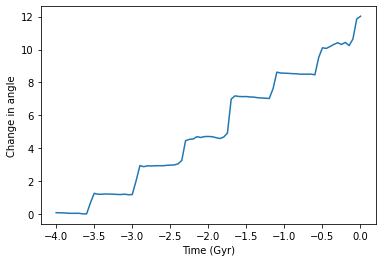

In [8]:
plt.plot(times,angles)
plt.xlabel('Time (Gyr)')
plt.ylabel('Change in angle')

Text(0, 0.5, 'Theta')

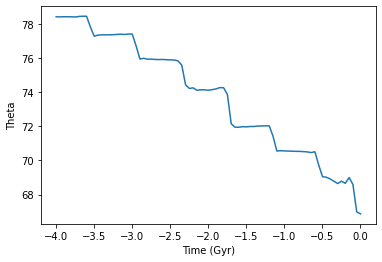

In [9]:
plt.plot(times,thetas)
plt.xlabel('Time (Gyr)')
plt.ylabel('Theta')

Text(0, 0.5, 'Phi')

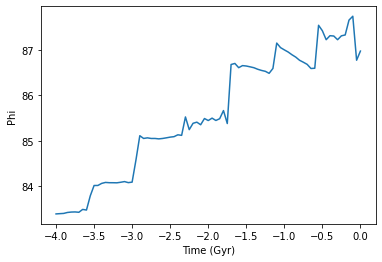

In [10]:
plt.plot(times,phis)
plt.xlabel('Time (Gyr)')
plt.ylabel('Phi')

Text(0, 0.5, 'Distance (kpc)')

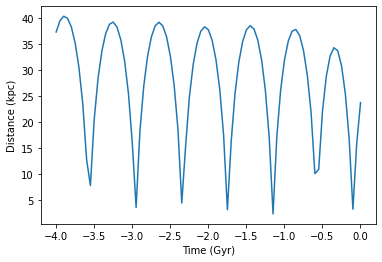

In [11]:
plt.plot(times,dists)
plt.xlabel('Time (Gyr)')
plt.ylabel('Distance (kpc)')

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
225.9097821712494 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
222.33363890647888 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
216.4275987148285 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
209.056871175766 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making t

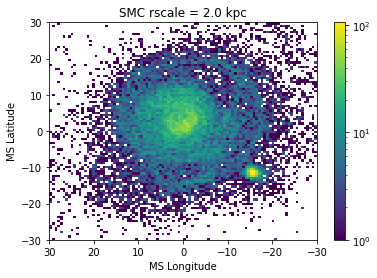

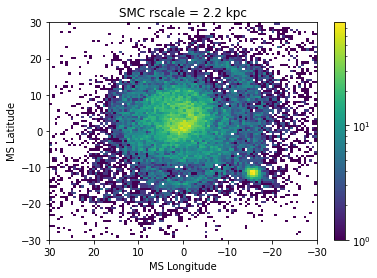

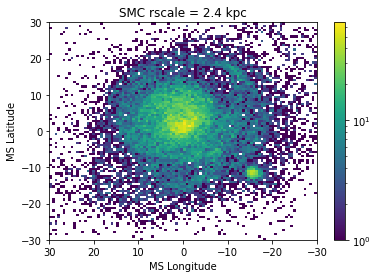

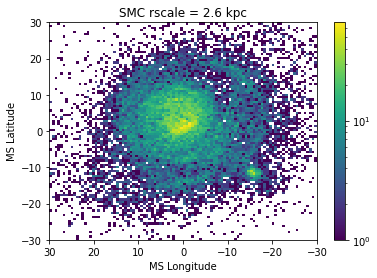

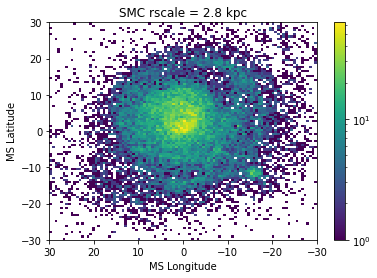

...

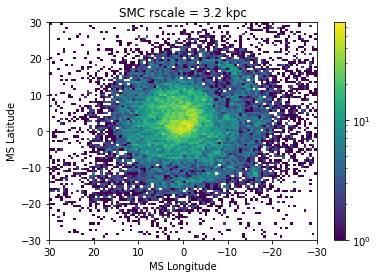

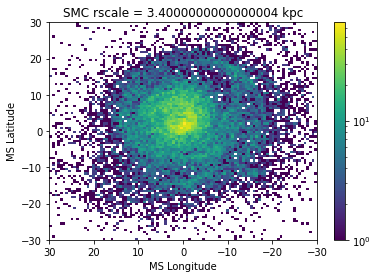

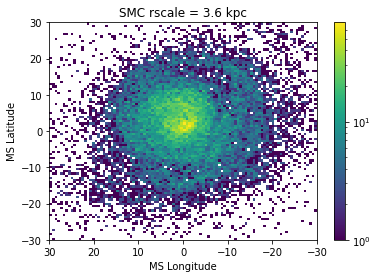

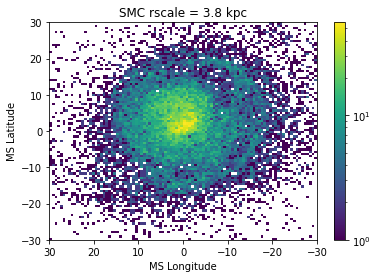

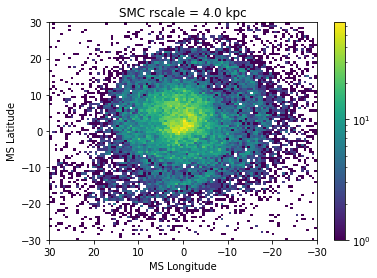

In [10]:
for rsmc in np.linspace(2,4,11):
    output2 = lsmc_orbit2(tstart=4.0,Rd=5,nlmc=25000,nsmc=5000,
                          h=1,rsmc=rsmc,noprint=True)
    last = output2[(output2['TIME']==np.max(output2['TIME']))]
    c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                    unit=u.kpc,frame='galactocentric')
    c_ms = c_gc.transform_to(ms.MagellanicStream)
    ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
    a = np.where(ms_lg>180)
    ms_lg[a] = ms_lg[a]-360
    plt.figure()
    plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
               range=[[-30,30],[-30,30]])
    plt.colorbar()
    plt.xlim(30,-30)
    plt.xlabel('MS Longitude')
    plt.ylabel('MS Latitude')
    plt.title('SMC rscale = {} kpc'.format(rsmc))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
219.4822118282318 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
247.2790563106537 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
214.76325273513794 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
247.59999251365662 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making

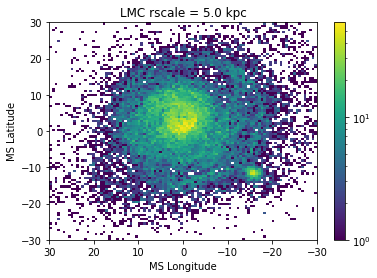

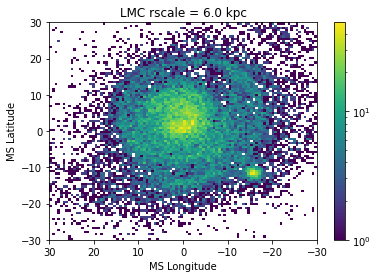

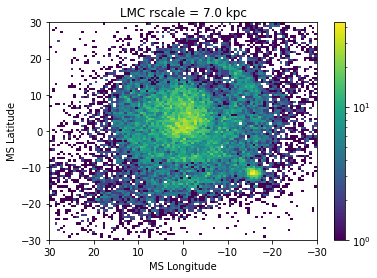

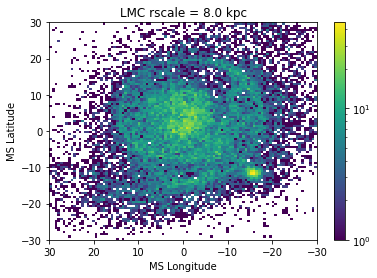

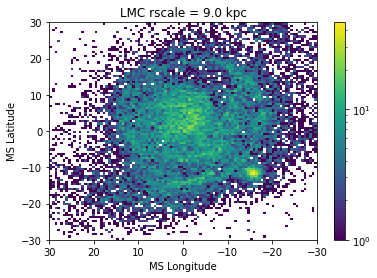

...

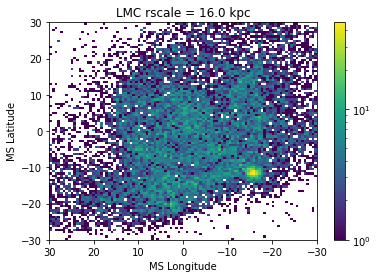

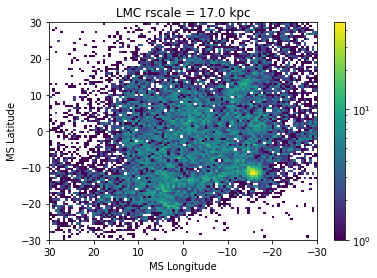

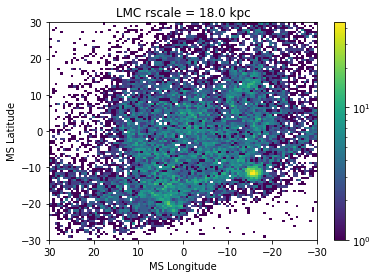

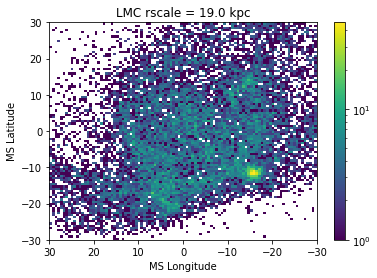

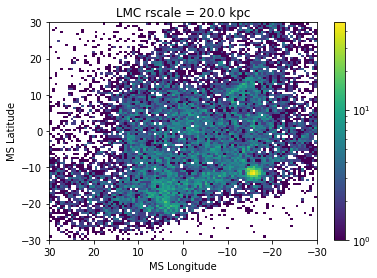

In [3]:
for rlmc in np.linspace(5,20,16):
    output2 = lsmc_orbit2(tstart=4.0,Rd=rlmc,nlmc=25000,nsmc=5000,
                          h=rlmc/5,noprint=True)
    last = output2[(output2['TIME']==np.max(output2['TIME']))]
    c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                    unit=u.kpc,frame='galactocentric')
    c_ms = c_gc.transform_to(ms.MagellanicStream)
    ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
    a = np.where(ms_lg>180)
    ms_lg[a] = ms_lg[a]-360
    plt.figure()
    plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
               range=[[-30,30],[-30,30]])
    plt.colorbar()
    plt.xlim(30,-30)
    plt.xlabel('MS Longitude')
    plt.ylabel('MS Latitude')
    plt.title('LMC rscale = {} kpc'.format(rlmc))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
214.12492060661316 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
213.31668138504028 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
213.11457991600037 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
214.60492205619812 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Maki

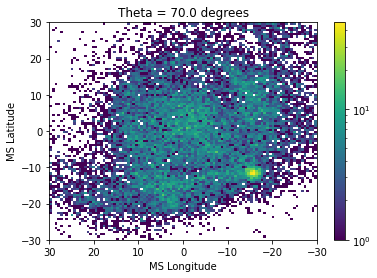

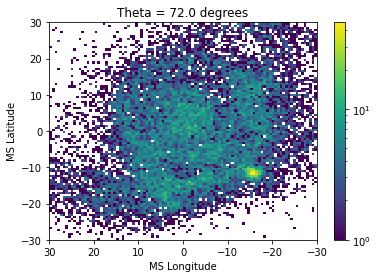

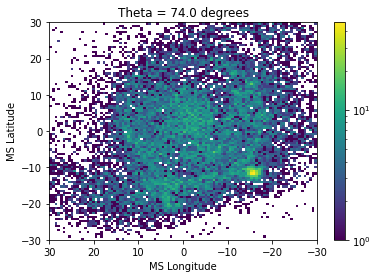

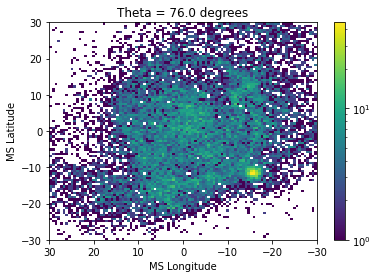

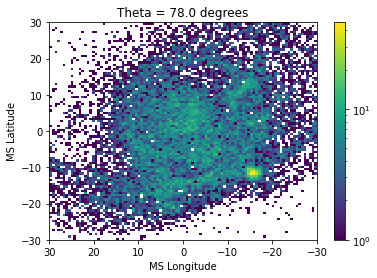

...

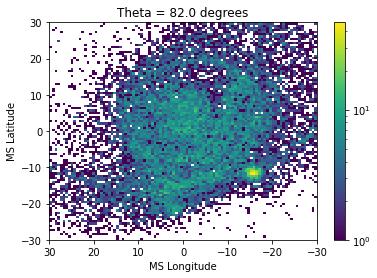

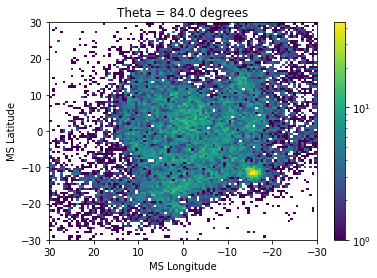

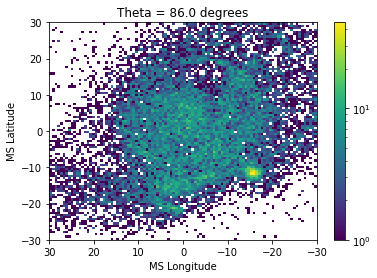

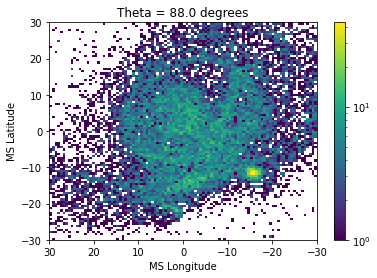

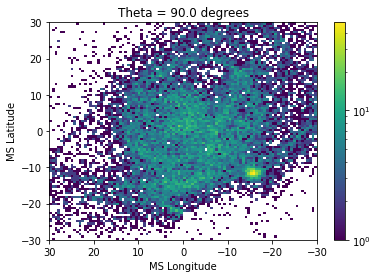

In [4]:
for theta in np.linspace(70,90,11):
    output2 = lsmc_orbit2(tstart=4.0,Rd=13,nlmc=25000,nsmc=5000,
                          h=13/5,noprint=True,theta=theta)
    last = output2[(output2['TIME']==np.max(output2['TIME']))]
    c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                    unit=u.kpc,frame='galactocentric')
    c_ms = c_gc.transform_to(ms.MagellanicStream)
    ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
    a = np.where(ms_lg>180)
    ms_lg[a] = ms_lg[a]-360
    plt.figure()
    plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
               range=[[-30,30],[-30,30]])
    plt.colorbar()
    plt.xlim(30,-30)
    plt.xlabel('MS Longitude')
    plt.ylabel('MS Latitude')
    plt.title('Theta = {} degrees'.format(theta))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
211.31453466415405 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
212.4019467830658 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
213.77524089813232 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 25000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
217.45027923583984 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Makin

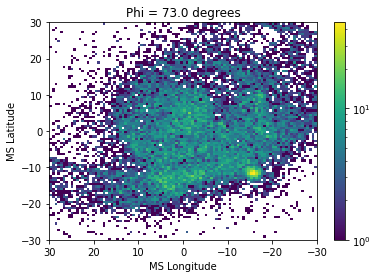

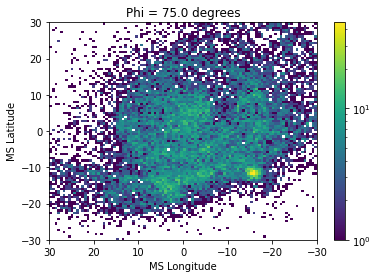

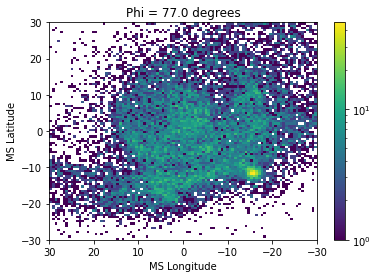

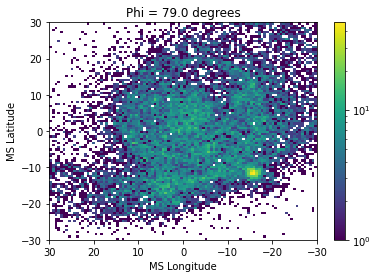

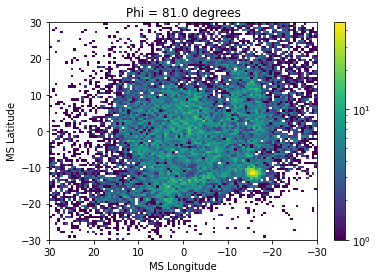

...

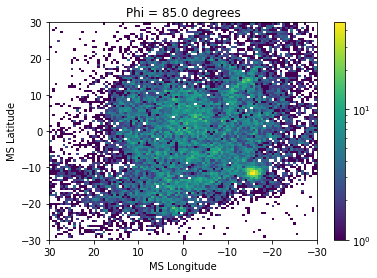

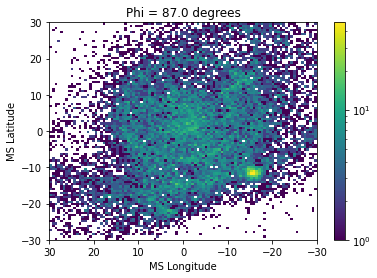

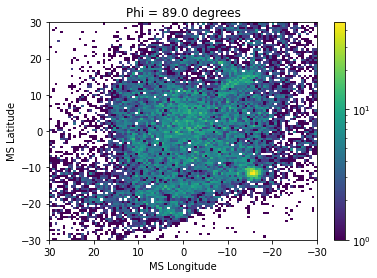

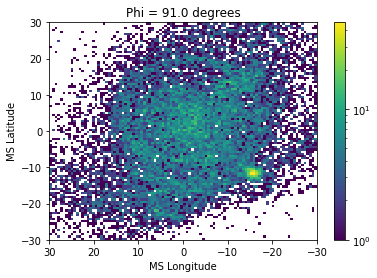

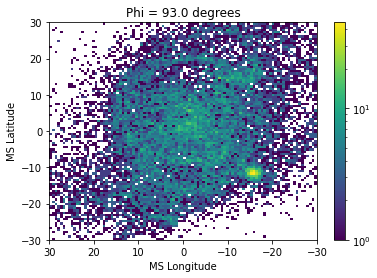

In [5]:
for phi in np.linspace(73,93,11):
    output2 = lsmc_orbit2(tstart=4.0,Rd=13,nlmc=25000,nsmc=5000,
                          h=13/5,noprint=True,phi=phi)
    last = output2[(output2['TIME']==np.max(output2['TIME']))]
    c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                    unit=u.kpc,frame='galactocentric')
    c_ms = c_gc.transform_to(ms.MagellanicStream)
    ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
    a = np.where(ms_lg>180)
    ms_lg[a] = ms_lg[a]-360
    plt.figure()
    plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
               range=[[-30,30],[-30,30]])
    plt.colorbar()
    plt.xlim(30,-30)
    plt.xlabel('MS Longitude')
    plt.ylabel('MS Latitude')
    plt.title('Phi = {} degrees'.format(phi))

Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 15000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
134.32142639160156 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 16000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
137.93822860717773 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 17000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
145.3189251422882 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making the LMC
USING 18000 STARS
Making the SMC
USING 5000 STARS
Getting Plummer distribution of stars
 
Running GALSAT program ...
151.8483428955078 seconds
Running the two single particles backwards
 
Running GALSAT program ...
Making

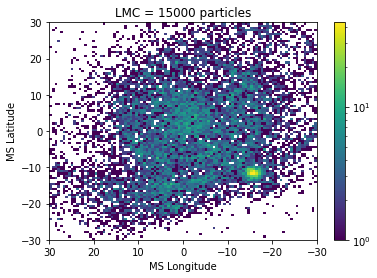

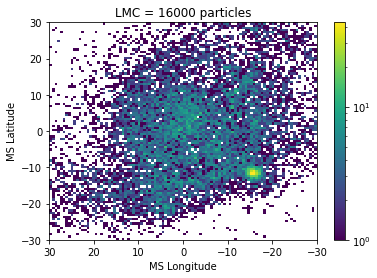

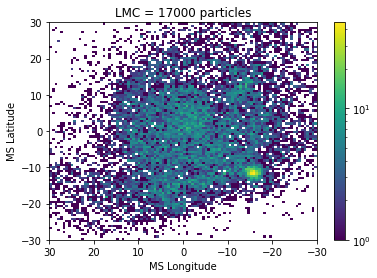

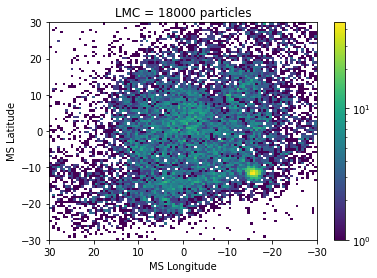

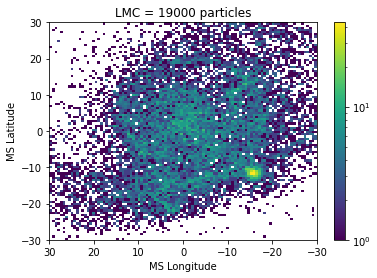

...

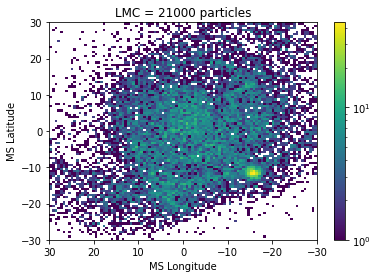

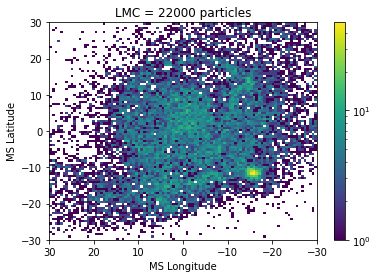

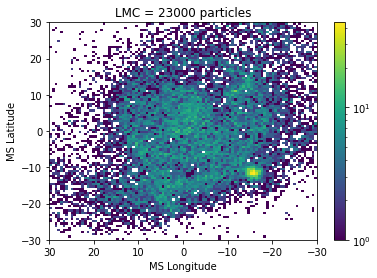

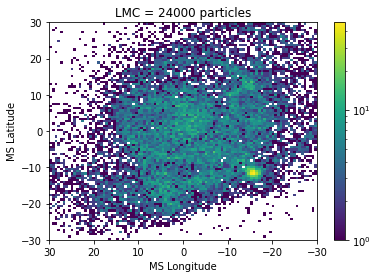

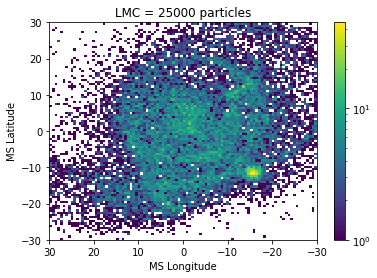

In [7]:
for nlmc in np.linspace(15000,25000,11):
    output2 = lsmc_orbit2(tstart=4.0,Rd=13,nlmc=int(nlmc),nsmc=5000,
                          h=13/5,noprint=True)
    last = output2[(output2['TIME']==np.max(output2['TIME']))]
    c_gc = SkyCoord(x=last['X'],y=last['Y'],z=last['Z'],
                    unit=u.kpc,frame='galactocentric')
    c_ms = c_gc.transform_to(ms.MagellanicStream)
    ms_lg,ms_bg = c_ms.MSLongitude.degree,c_ms.MSLatitude.degree
    a = np.where(ms_lg>180)
    ms_lg[a] = ms_lg[a]-360
    plt.figure()
    plt.hist2d(ms_lg,ms_bg,norm=LN(),bins=100,
               range=[[-30,30],[-30,30]])
    plt.colorbar()
    plt.xlim(30,-30)
    plt.xlabel('MS Longitude')
    plt.ylabel('MS Latitude')
    plt.title('LMC = {} particles'.format(int(nlmc)))

In [9]:
lmass = 1.8e11#2d10
0.9*(lmass/1e9)**(1./3.)

5.081594555957554